<h1 dir="rtl">פרוייקט גמר בהנדסת תוכנה - נוכחות בכיתה</h1>

<p dir="rtl">
  <img src="https://c.files.bbci.co.uk/181CC/production/_110246789_facialrecognition3.gif" width=500>
</p>

<h3 dir="rtl">מגיש: יונתן קזאז</h3>
<h3 dir="rtl">מורה מנחה: שי פרח</h3>
<h3 dir="rtl">בית ספר: עירוני ד תל אביב</h3>
<h3 dir="rtl">כיתה: יב7</h3>




#2.מטרת הפרוייקט
<h3 dir="rtl">
מטרת הפרוייקט היא להבין איך וכיצד לסווג תמונות של אנשים גם כאשר לא אימנו עליהם את המודל שלנו
</h3>
<h3 dir="rtl">ולבסוף להכין את האפליקציה של נוכחות בכיתה</h3>


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os  # Provides a way of using operating system dependent functionality.
import traceback  # Helps in managing errors by providing a stack trace.

import numpy as np  # Fundamental package for scientific computing with Python.
import cv2  # OpenCV library for computer vision tasks.

import tensorflow as tf  # Machine learning and neural networks library.
import keras  # Deep learning library for building neural networks.
from keras import optimizers, metrics, Model  # Importing specific classes from keras for building and optimizing models.
from keras.layers import Layer, Input, Conv2D, Conv1D, MaxPooling2D, BatchNormalization, GlobalAveragePooling2D, Normalization, Dense, Add, Dropout, ReLU, ELU, MultiHeadAttention  # Various types of neural network layers.

from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TerminateOnNaN  # Callback functions to improve training by performing actions at certain stages.
from keras.regularizers import L1L2, L2  # Regularization techniques to prevent overfitting.

from keras.utils import plot_model # library for desplaying the neural network
import matplotlib.pyplot as plt  # Library for creating visualizations.
import plotly.express as px  # Advanced plotting library for complex charts.
from collections import Counter # for the second graph

#commenting purposes:
from typing import Dict, List, Tuple, NoReturn, Any, Optional
from tensorflow import Tensor
from tensorflow.data import Dataset
from keras.callbacks import History

#for saving purposes
import pickle


In [ ]:
# Set the global policy to 'mixed_float16' to enable mixed precision training.
# This setting allows the model to use float16 and float32 data types where appropriate,
# reducing memory usage and potentially improving computational speed on compatible hardware.
keras.mixed_precision.set_global_policy("mixed_float16")

In [ ]:
# Define the root directory path for the dataset.
root_src: str = r"/content/drive/MyDrive/facial_Recognition/LFW/"
# Join the path for the subdirectory containing extracted faces.
data_src: str = os.path.join(root_src, "Extracted Faces/Extracted Faces")

# Retrieve the list of directories (each representing an individual) from the dataset folder.
directories: List[str] = os.listdir(data_src)

# Print the total number of unique individuals in the dataset.
print(f"Total number of individuals: {len(directories)}\n")
# Print the names of the individuals sorted alphabetically.
print(f"Name of the individuals : \n\t{sorted(directories)}")

Total number of individuals: 1324

Name of the individuals : 
	['0', '1', '10', '1000', '1001', '1002', '1006', '1007', '101', '1013', '1014', '1015', '1016', '1017', '1018', '1019', '102', '1020', '1021', '1022', '1024', '1025', '1026', '1027', '1029', '103', '1030', '1031', '1032', '1033', '1034', '1035', '1036', '1038', '1039', '104', '1040', '1042', '1043', '1045', '1046', '1047', '1049', '105', '1050', '1051', '1052', '1053', '1055', '1057', '1059', '106', '1060', '1061', '1062', '1063', '1066', '1067', '1068', '1069', '107', '1070', '1071', '1072', '1073', '1074', '1075', '1076', '1077', '1079', '1081', '1082', '1084', '1085', '1086', '1087', '1088', '1089', '109', '1090', '1091', '1092', '1093', '1094', '1095', '1096', '1097', '1098', '1099', '110', '1100', '1101', '1102', '1104', '1105', '1106', '1107', '1108', '1109', '111', '1110', '1111', '1112', '1113', '1114', '1115', '1116', '1117', '1119', '112', '1120', '1122', '1123', '1124', '1125', '1127', '1128', '113', '1130', '113

In [ ]:
import tensorflow as tf
import os
import numpy as np

def load_dataset(dataset_path):
    image_paths = []
    labels = []
    label_map = {}
    label_counter = 0

    for person_folder in os.listdir(dataset_path):
        person_path = os.path.join(dataset_path, person_folder)
        if os.path.isdir(person_path):
            for img in os.listdir(person_path):
                image_paths.append(os.path.join(person_path, img))
                if person_folder not in label_map:
                    label_map[person_folder] = label_counter
                    label_counter += 1
                labels.append(label_map[person_folder])

    return image_paths, labels

def create_triplets(image_paths, labels):
    image_paths = np.array(image_paths)
    labels = np.array(labels)
    unique_labels = np.unique(labels)

    triplets = []

    for label in unique_labels:
        same_class_indices = np.where(labels == label)[0]
        if len(same_class_indices) < 2:
            continue

        for i in range(len(same_class_indices) - 1):
            anchor = image_paths[same_class_indices[i]]
            positive = image_paths[same_class_indices[i + 1]]

            while True:
                negative_label = np.random.choice(unique_labels)
                if negative_label != label:
                    negative_indices = np.where(labels == negative_label)[0]
                    negative = np.random.choice(image_paths[negative_indices])
                    break

            triplets.append((anchor, positive, negative))

    return triplets

def preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [224, 224])
    image = image / 255.0
    return image

def tf_load_triplet(anchor_path, positive_path, negative_path):
    anchor = tf.py_function(preprocess_image, [anchor_path], tf.float32)
    positive = tf.py_function(preprocess_image, [positive_path], tf.float32)
    negative = tf.py_function(preprocess_image, [negative_path], tf.float32)
    return anchor, positive, negative

# Set the path to your dataset
dataset_path = 'path_to_your_LFW_dataset'

# Load dataset using TensorFlow operations
image_paths, labels = load_dataset(data_src)

# Create triplets using TensorFlow operations
triplets = create_triplets(image_paths, labels)

# Convert triplets to TensorFlow dataset
anchor_paths, positive_paths, negative_paths = zip(*triplets)
anchor_paths = list(anchor_paths)
positive_paths = list(positive_paths)
negative_paths = list(negative_paths)

# Create TensorFlow dataset from the triplet paths
dataset = tf.data.Dataset.from_tensor_slices((anchor_paths, positive_paths, negative_paths))
dataset = dataset.map(tf_load_triplet, num_parallel_calls=tf.data.AUTOTUNE)

# Split dataset into training and validation
train_size = int(0.8 * len(triplets))
train_dataset = dataset.take(train_size)
val_dataset = dataset.skip(train_size)

# Shuffle, batch, and prefetch the datasets
train_dataset = train_dataset.shuffle(buffer_size=1024).batch(64).prefetch(buffer_size=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(64).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
# Example: Iterate through the dataset
for anchor, positive, negative in dataset.take(1):
    print(anchor.shape, positive.shape, negative.shape)

(224, 224, 3) (224, 224, 3) (224, 224, 3)


#pre proccessing

In [ ]:
# Dictionary to count the number of images per person
image_count = {}

# Iterate over each directory (each person)
for person in os.listdir(data_src):
    person_dir = os.path.join(data_src, person)
    if os.path.isdir(person_dir):
        # Count the number of images for each person
        image_count[person] = len(os.listdir(person_dir))

# Now, we calculate how many people have the same number of images
count_frequencies = Counter(image_count.values())

# Prepare data for plotting
data = {'Image_Count': list(count_frequencies.keys()), 'Number_of_People': list(count_frequencies.values())}

In [ ]:
# Calculate the number of images for each individual in the dataset.
n_images_per_person: List[int] = [len(os.listdir(os.path.join(data_src, directory))) for directory in directories]
# Sum up the total number of images across all individuals.
n_images: int = sum(n_images_per_person)

# Display the total number of images in the dataset.
print(f"Total Number of Images : {n_images}")

Total Number of Images : 6107


In [ ]:
# Create the bar chart
fig = px.bar(
    x=directories,
    y=n_images_per_person,
    labels={'x': 'Individual', 'y': 'Number of Images'},
    title="Distribution of Number of Images per Person in the LFW Dataset"
)

# Update layout for better aesthetics
fig.update_layout(
    xaxis_title="Individuals",
    yaxis_title="Number of Images",
    title={
        'text': "Distribution of Number of Images per Person",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis={'categoryorder':'total descending'},  # Optional: This sorts the bars based on the count
    plot_bgcolor='white'  # Set background color to white for a cleaner look
)

# Optionally, you can add grid lines for better readability
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='LightPink')

# Display the plot
fig.show()

In [ ]:
# Create the pie chart
fig = px.pie(
    data,
    values='Number_of_People',
    names='Image_Count',
    title='Distribution of Image Counts per Person in the LFW Dataset',
    labels={'Image_Count': 'Number of Images per Person'},
    hole=0.4  # Creates a donut-like pie chart
)

# Update traces for better text positioning and information display
fig.update_traces(
    textposition='inside',
    textinfo='percent+label',
    hoverinfo='label+percent',  # Enhanced hover text including label and percentage
    marker=dict(line=dict(color='white', width=2))  # Adds a white line between sections for clarity
)

# Update the layout for a cleaner and more informative presentation
fig.update_layout(
    title={
        'text': "Distribution of Image Counts per Person",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    legend_title_text='Image Count',  # Adds a title to the legend for clarity
    plot_bgcolor='rgba(0,0,0,0)',  # Transparent background
    font=dict(
        family="Arial, sans-serif",  # Font style
        size=12,  # Font size
        color="RebeccaPurple"  # Font color
    )
)


# Display the plot
fig.show()

In [ ]:
def learning_curves(fit_data: History) -> None:
    """
    This function plots the training and validation loss and accuracy for each epoch during training.

    Args:
    fit_data: A history object containing the training and validation metrics. The history object
              is typically returned by the `fit` method of a Keras model.

    The function creates two plots:
    1. Training and Validation Loss: Plots the triplet loss starting from the third epoch to emphasize
       trends after initial adjustments.
    2. Training and Validation Accuracy: Plots the accuracy metrics for both training and validation sets
       across all epochs.

    Both plots are labeled with axes titles and include a legend to differentiate between training and
    validation metrics.
    """
    # Plot training and validation loss starting from the third epoch.
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Triplet loss')
    plt.plot(fit_data.history['loss'][2:], label='train')  # Excludes the first two points.
    plt.plot(fit_data.history['val_loss'][2:], label='val')  # Excludes the first two points.
    plt.legend()
    plt.show()

    # Plot training and validation accuracy across all epochs.
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.plot(fit_data.history['accuracy'], label='train_acc')
    plt.plot(fit_data.history['val_accuracy'], label='validation_acc')
    plt.legend()
    plt.show()


In [ ]:
def print_best_val_accuracy_and_epoch(fit_data: History) -> None:
    """
    This function finds and prints the highest validation accuracy and the epoch number at which it was achieved.

    Args:
    fit_data: A history object containing the training and validation metrics. The history object
              is typically returned by the `fit` method of a Keras model.

    The function computes the maximum validation accuracy from the history of training and identifies
    the corresponding epoch. It prints out this information, showing the best validation accuracy and
    at which epoch it was recorded.
    """
    # Retrieve the list of validation accuracy values from the training history.
    val_accuracy_list: List[float] = fit_data.history['val_accuracy']
    # Find the maximum validation accuracy value.
    best_val_acc: float = max(val_accuracy_list)
    # Find the index of the maximum validation accuracy, which corresponds to the epoch.
    best_val_acc_epoch: int = np.argmax(val_accuracy_list)
    # Print the best validation accuracy and the epoch it was achieved at, adjusting the epoch count to be 1-based.
    print(f"The maximum validation accuracy was {format(best_val_acc * 100, '.2f')}% and it was reached on epoch {best_val_acc_epoch + 1} out of {len(val_accuracy_list)}")


In [ ]:
class PreProcessing:
    """
    A class for preprocessing images for face verification using triplet loss.
    It sets up the dataset, organizes labels, and provides methods to generate
    triplets of images (anchor, positive, negative).

    Attributes:
        data_src (str): Directory path to the image data.
        ds_length (int): Total number of images in the dataset.
        batch_size (int): Number of images per batch. Default is 32.
        img_size (int): Size to which each image is resized. Default is 224x224 pixels.
    """

    def __init__(self, data_src: str, ds_length: int, batch_size: int = 32, img_size: int = 224):
        """
        Initializes the preprocessing pipeline by setting directory paths, dataset length, batch size, and image size.
        It also prepares labels and maps them to their respective images.
        """
        self.data_src: str = data_src
        self.ds_length: int = ds_length
        self.batch_size: int = batch_size
        self.img_size: int = img_size
        print("Initializing...")
        self.unique_train_label, self.label_to_index = self._prepare_labels()
        print("Initialization Done.")

    def __len__(self) -> int:
        """
        Return the number of batches per epoch.
        """
        return self.ds_length // self.batch_size

    def _prepare_labels(self) -> Tuple[np.ndarray, Dict[str, List[str]]]:
        """
        Private method to collect labels and map them to their respective image files.
        Returns a tuple containing unique labels and a dictionary mapping labels to image file paths.
        """
        labels: List[str] = []
        label_to_index: Dict[str, List[str]] = {}
        for directory in os.listdir(self.data_src):
            directory_path: str = os.path.join(self.data_src, directory)
            if os.path.isdir(directory_path):
                labels.append(directory)
                label_to_index[directory] = [os.path.join(directory_path, file) for file in os.listdir(directory_path)]
        return np.unique(labels), label_to_index

    def _process_image(self, file_path: str) -> Tensor:
        """
        Private method to read and process an image from a file path, resize it, and normalize its pixels.
        """
        try:
            img: Tensor = tf.io.read_file(file_path)
            img: Tensor = tf.image.decode_jpeg(img, channels=3)
            img: Tensor = tf.image.resize(img, (self.img_size, self.img_size))
            img /= 255.0  # Normalize
            return img
        except Exception as e:
            print(f"Failed to process image {file_path}: {e}")
            return None

    def get_triplets(self) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
        """
        Generator to produce batches of image triplets for training.
        Each batch contains anchor, positive, and negative images.
        """
        for _ in range(self.__len__()):
            anchor_images: List[Tensor] = []
            positive_images: List[Tensor] = []
            negative_images: List[Tensor] = []
            for _ in range(self.batch_size):
                try:
                    label_a, label_n = np.random.choice(self.unique_train_label, 2, replace=False)
                    if len(self.label_to_index[label_a]) < 2 or len(self.label_to_index[label_n]) < 1:
                        continue  # Skip if not enough images
                    a_path, p_path = np.random.choice(self.label_to_index[label_a], 2, replace=False)  # Note: replace=False to ensure different images
                    n_path = np.random.choice(self.label_to_index[label_n])
                except ValueError as e:
                    print(f"Skipping due to error: {e}")
                    continue

                a_img: Tensor = self._process_image(a_path)
                p_img: Tensor = self._process_image(p_path)
                n_img: Tensor = self._process_image(n_path)

                if all(img is not None for img in (a_img, p_img, n_img)):
                    anchor_images.append(a_img)
                    positive_images.append(p_img)
                    negative_images.append(n_img)

            yield (np.array(anchor_images), np.array(positive_images), np.array(negative_images))

    def get_triplets_dataset(self) -> tf.data.Dataset:
        """
        Creates a TensorFlow data generator that yields batches of image triplets for training.
        """
        return tf.data.Dataset.from_generator(
            lambda: self.get_triplets(),
            output_types=(tf.float32, tf.float32, tf.float32),
            output_shapes=(
                [None, self.img_size, self.img_size, 3],
                [None, self.img_size, self.img_size, 3],
                [None, self.img_size, self.img_size, 3]
            )
        )

In [ ]:
class ImageDisplayUtils:
    """
    A utility class for displaying image triplets from a dataset. This class is particularly
    useful for visualizing the results and understanding the triplet selection in models
    trained with triplet loss.
    """

    @staticmethod
    def display_triplets(triplets_dataset: tf.data.Dataset, rows: int = 5) -> None:
        """
        Displays a specified number of triplets from the dataset.

        Parameters:
            triplets_dataset (tf.data.Dataset): A TensorFlow dataset object that yields triplets
                                               of images (anchors, positives, negatives).
            rows (int): Number of triplets to display. Each triplet consists of an anchor,
                        a positive, and a negative image.

        Note:
            The method assumes that each element in the dataset contains three images. If the
            dataset structure differs, this method may require adjustments.
        """
        plt.figure(figsize=(15, 6 * rows))  # Create a figure with appropriate size

        # Iterate over the specified number of triplets from the dataset
        for i, (anchors, positives, negatives) in enumerate(triplets_dataset.take(rows)):
            # Display each image in the triplet
            for idx in range(3):  # Iterate over anchor, positive, and negative
                plt.subplot(rows, 3, i * 3 + idx + 1)
                image: tf.Tensor = tf.zeros_like(anchors[0])  # Default blank image
                title: str = ""

                if idx == 0:
                    image = anchors[0]  # Display the first anchor image
                    title = "Anchor"
                elif idx == 1:
                    image = positives[0]  # Display the first positive image
                    title = "Positive"
                else:
                    image = negatives[0]  # Display the first negative image
                    title = "Negative"

                plt.imshow(image.numpy(), cmap='gray')  # Display the image in grayscale
                plt.title(title)
                plt.axis('off')  # Turn off axis labels and ticks

        plt.tight_layout()  # Adjust subplots to fit into the figure area.
        plt.show()  # Display the figure with the triplets

In [ ]:
# Initialize an instance of the PreProcessing class to set up image preprocessing for triplet generation.
# `data_src` is the directory containing image data, `1600` represents the total number of images,
# and `64` is the batch size, meaning each batch will contain 64 triplets.
dataset_gen: PreProcessing = PreProcessing(data_src, ds_length=32000, batch_size=64)

In [ ]:
# Retrieve a TensorFlow dataset object that yields batches of image triplets (anchor, positive, negative).
# This dataset is now ready to be used for training or testing in a machine learning model that
# utilizes triplet loss, typically used for tasks like face verification.
dataset: Dataset = dataset_gen.get_triplets_dataset()

In [ ]:
#@title saving the dataset
saving_path: str = os.path.join(root_src,"LFW", "dataset.tfrecord")

dataset.save(saving_path)

In [ ]:
#@title loading it back up
saving_path: str = os.path.join(root_src, "dataset.tfrecord")

dataset: Dataset = tf.data.Dataset.load(saving_path)


#assesing the difficulty of the dataset

In [ ]:
# Retrieve the total number of batches available in the dataset.
count: int = 1600//64#len(dataset_gen)

In [ ]:
# Take the first 80% of batches from the dataset for training.
train_ds: Dataset = dataset.take(round(count * 0.9))

# Skip the first 80% of batches and take the remaining 20% for validation.
val_ds: Dataset = dataset.skip(round(count * 0.1))

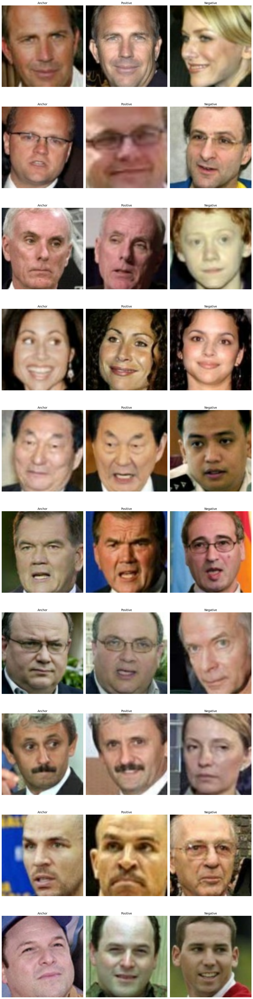

In [ ]:
# Use the ImageDisplayUtils class to display ten rows of image triplets from the training dataset.
# This helps visually confirm the diversity and quality of the triplets used in training, ensuring
# that the dataset is correctly prepared and suitable for the intended machine learning tasks.
ImageDisplayUtils.display_triplets(train_ds, rows=10)


In [ ]:
def configure_for_performance(ds: Dataset) -> Dataset:
    """
    Configures a TensorFlow dataset for improved performance during model training.

    Args:
        ds (Dataset): The dataset to be optimized.

    Returns:
        Dataset: The optimized dataset, with configurations for caching and prefetching.
    """
    # Caches the dataset in memory or on local storage. This can significantly improve performance
    # by avoiding redundant data fetching and preprocessing operations, especially when the dataset
    # can fit into memory.
    ds: dataset = ds.cache()

    # Prefetches data for the next batch while the current batch is being processed.
    # This step is critical to ensure the training process does not need to wait for data to be ready.
    # AUTOTUNE allows TensorFlow to automatically manage the buffer size based on runtime conditions,
    # optimizing the amount of data that needs to be held in memory.
    return ds.prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
# Apply performance enhancements to the training dataset to improve efficiency during the model training process.
train_ds: dataset = configure_for_performance(train_ds)

# Apply the same performance enhancements to the validation dataset to ensure consistency in data processing
# between training and validation phases. This helps in maintaining efficient use of resources during model evaluations.
val_ds: dataset = configure_for_performance(val_ds)


#defining the test dataset and optimizing it

In [ ]:
# Set the batch size for processing; this will determine how many items are processed together in each step.
batch_size: int = 64  # The desired batch size is 64.

# Calculate the number of images required for the test set, which is 20% of the total dataset,
# adjusted for the batch size.
test_length: int = round(count * batch_size * 0.2)
print(test_length)  # Output the computed size of the test dataset for verification.

320


In [ ]:
# Initialize the preprocessing class for the test dataset. Here, the batch size is set to 1,
# meaning each batch contains one triplet. This setting might be specific for certain test scenarios
# or for detailed evaluation where individual triplet handling is needed.
test_gen: PreProcessing = PreProcessing(data_src, test_length, batch_size=1)

Initializing...
Initialization Done.


In [ ]:
# Generate the test dataset containing triplets (anchor, positive, negative) ready for model evaluation.
test_ds: Dataset = test_gen.get_triplets_dataset()

In [ ]:
# Optimize the test dataset for performance in the same manner as the training and validation datasets,
# ensuring efficient data loading and processing during model testing.
test_ds: Dataset = configure_for_performance(test_ds)

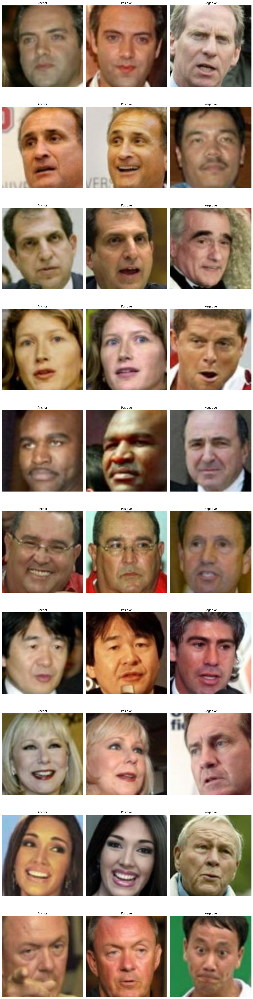

In [ ]:
# Use the ImageDisplayUtils class to display ten rows of image triplets from the test dataset.
# This visualization helps in examining the outputs of the dataset preparation, particularly
# useful for verifying the correctness of the triplets (anchor, positive, negative) generated for testing.
ImageDisplayUtils.display_triplets(test_ds, rows=10)

#defining the evaluation functions

In [ ]:
def avg_distance(model: Model, ds: Dataset) -> Dict[str, float]:
    """
    Calculates the average distance using the model's predictions for anchor-positive and anchor-negative pairs
    across the entire dataset by incremental averaging.

    Args:
        model (Model): The trained model used to predict distances.
        ds (Dataset): The dataset containing the triplets (anchor, positive, negative).
        ds_length (int): The total number of triplets in the dataset to normalize the distance calculations.

    Returns:
        Dict[str, float]: Dictionary containing the average distances for anchor-positive and anchor-negative pairs.
    """

    average_ap_distance: float = 0.0
    average_an_distance: float = 0.0
    for index, (anchor, positive, negative) in enumerate(ds):
        # Assume the model.predict returns a list of floats, with distances for positive and negative pairs respectively
        distances: List[float] = model.predict([anchor, positive, negative], verbose=0)

        # Incremental averaging: new_avg = old_avg + (new_value - old_avg) / (index + 1)
        average_ap_distance += (distances[0] - average_ap_distance) / (index + 1)
        average_an_distance += (distances[1] - average_an_distance) / (index + 1)

    return {
        'average_anchor_positive_distance': average_ap_distance[0],
        'average_anchor_negative_distance': average_an_distance[0]
    }

In [ ]:
def cosine_similarity(a: Tensor, b: Tensor) -> Tensor:
    """
    Compute the cosine similarity between two tensors `a` and `b`.

    Args:
        a (tf.Tensor): Tensor of shape (N, D), where N is the batch size, and D is the dimensionality.
        b (tf.Tensor): Tensor of shape (N, D), similar to `a`.

    Returns:
        tf.Tensor: Tensor of shape (N,), containing the cosine similarity for each pair.
    """
    a_normalized: tf.Tensor = tf.nn.l2_normalize(a, axis=-1)
    b_normalized: tf.Tensor = tf.nn.l2_normalize(b, axis=-1)
    cosine_similarity: tf.Tensor = tf.reduce_sum(tf.multiply(a_normalized, b_normalized), axis=-1)
    return cosine_similarity

In [ ]:
def evaluate_dataset_difficulty_with_embeddings(embedding_model: Model, dataset: Dataset, num_batches: int = 100) -> Dict[str, float]:
    """
    Evaluate the dataset difficulty by computing the average cosine similarity for anchor-positive and
    anchor-negative pairs over a number of batches, using embeddings generated by the trained embedding model.

    Args:
        embedding_model (tf.keras.Model): Model used to generate embeddings from the input images.
        dataset (Dataset): Batched dataset generating triplets (anchor, positive, negative).
        num_batches (int): Number of batches to sample for the evaluation.

    Returns:
        Dict[str, float]: Dictionary with average cosine similarities for 'anchor_positive' and 'anchor_negative'.
    """
    # Initialize lists as NumPy arrays
    ap_cosine_similarities: np.ndarray = np.array([], dtype=np.float32)
    an_cosine_similarities: np.ndarray = np.array([], dtype=np.float32)

    for batch in dataset.take(num_batches):
        anchor, positive, negative = batch
        # Combine into a single batch for efficient computation
        combined: Tensor = tf.concat([anchor, positive, negative], axis=0)
        embeddings: Tensor = embedding_model(combined)

        # Split back into individual embeddings
        anchor_emb, positive_emb, negative_emb = tf.split(embeddings, 3, axis=0)

        ap_cosine_similarity: Tensor = cosine_similarity(anchor_emb, positive_emb)
        an_cosine_similarity: Tensor = cosine_similarity(anchor_emb, negative_emb)

        # Calculate the mean for each batch and append
        ap_cosine_similarities = np.append(ap_cosine_similarities, tf.reduce_mean(ap_cosine_similarity).numpy())
        an_cosine_similarities = np.append(an_cosine_similarities, tf.reduce_mean(an_cosine_similarity).numpy())

    avg_ap_cosine_similarity: float = np.mean(ap_cosine_similarities)
    avg_an_cosine_similarity: float = np.mean(an_cosine_similarities)

    return {
        'average_anchor_positive_similarity': avg_ap_cosine_similarity,
        'average_anchor_negative_similarity': avg_an_cosine_similarity
    }

In [ ]:
def evaluating_the_model(model: tf.keras.Model, test_ds: Dataset) -> None:
    """
    Evaluates the given model on a provided test dataset and prints the loss and accuracy.

    Args:
        model (tf.keras.Model): The trained model to evaluate.
        test_ds (tf.data.Dataset): The test dataset on which the model will be evaluated.

    Returns:
        None: This function does not return any value; it only prints the evaluation results.
    """
    # Evaluate the model on the provided dataset. The evaluate function returns a list of float values where
    # the first element is the loss and the second is the accuracy.
    score: List[float] = model.evaluate(test_ds)

    # Print the loss and accuracy in a formatted way.
    loss: float = score[0]  # Extracting loss for clearer annotation and usage.
    accuracy: float = score[1]  # Extracting accuracy for clearer annotation and usage.

    # Format the accuracy as a percentage rounded to 2 decimal places for a cleaner display.
    formatted_accuracy: str = f"{accuracy * 100:.2f}%"
    print("Test loss:", loss)
    print("Test accuracy:", formatted_accuracy)

#building and defining the model wrapper and final layer

In [ ]:
@keras.saving.register_keras_serializable()
class DistanceLayer(Layer):
    """
    A custom layer that computes the squared Euclidean distance between pairs of embeddings:
    anchor-positive and anchor-negative. This layer is typically used in triplet loss functions
    where the goal is to ensure that, in the embedding space, positive examples are closer to
    the anchor than negative examples are.

    This layer is serializable, allowing it to be saved and loaded along with the TensorFlow model.
    """

    def __init__(self, **kwargs):
        """
        Initializes the DistanceLayer instance using the standard initialization process.
        """
        super().__init__(**kwargs)

    def call(self, anchor: tf.Tensor, positive: tf.Tensor, negative: tf.Tensor) -> Tuple[tf.Tensor, tf.Tensor]:
        """
        Compute the squared distances between the anchor and positive examples,
        and the anchor and negative examples.

        Args:
            anchor (tf.Tensor): The anchor embeddings.
            positive (tf.Tensor): The positive embeddings corresponding to the anchors.
            negative (tf.Tensor): The negative embeddings, not matching the anchors.

        Returns:
            Tuple[tf.Tensor, tf.Tensor]: A tuple containing the distances between anchors and positives,
                                         and anchors and negatives, respectively.
        """
        # Squared Euclidean distance calculations
        ap_distance: tf.Tensor = tf.reduce_sum(tf.square(anchor - positive), axis=-1)
        an_distance: tf.Tensor = tf.reduce_sum(tf.square(anchor - negative), axis=-1)
        return (ap_distance, an_distance)

    def get_config(self) -> dict:
        """
        Returns the configuration of the layer as a dictionary. This method ensures the layer can be
        recreated in the exact same configuration.

        Returns:
            dict: A dictionary containing the configuration of the layer.
        """
        config: Dict[str, Any]  = super().get_config()
        return config

    @classmethod
    def from_config(cls, config: dict) -> 'DistanceLayer':
        """
        Recreates a DistanceLayer instance from its configuration (used during model loading).

        Args:
            config (dict): A dictionary containing the configuration of the layer.

        Returns:
            DistanceLayer: A new instance of the DistanceLayer with the specified configuration.
        """
        return cls(**config)

In [ ]:
@keras.saving.register_keras_serializable()
class SiameseModel(Model):
    """
    The Siamese Network model with a custom training and testing loops for triplet loss.

    The triplet loss is defined as:
       L(A, P, N) = max(‖f(A) - f(P)‖² - ‖f(A) - f(N)‖² + margin, 0)

    Attributes:
        siamese_network (Model): The underlying Siamese network model that processes input.
        margin (float): The margin by which the distance between the anchor and negative should be greater
                        than the distance between the anchor and positive.
    """
    def __init__(self, siamese_network: Model, margin: float = 0.5):
        super().__init__()
        self.siamese_network: Model = siamese_network
        self.margin: float = margin
        self.loss_tracker: metrics.Mean = metrics.Mean(name="loss")
        self.accuracy_tracker: metrics.Mean = metrics.Mean(name="accuracy")

    def call(self, inputs: Tuple[tf.Tensor, tf.Tensor, tf.Tensor]) -> Tuple[tf.Tensor, tf.Tensor]:
        return self.siamese_network(inputs)

    def train_step(self, data: Tuple[tf.Tensor, tf.Tensor, tf.Tensor]) -> Dict[str, Any]:
        """
        Performs a single training step using the provided triplet batch.

        Args:
            data (Tuple[tf.Tensor, tf.Tensor, tf.Tensor]): The batch containing the triplets
            (anchor, positive, negative).

        Returns:
            Dict[str, Any]: A dictionary containing the 'loss' and 'accuracy' for the batch.
        """
        with tf.GradientTape() as tape:
            loss: tf.Tensor = self._compute_loss(data)
            scaled_loss: tf.Tensor = self.optimizer.get_scaled_loss(loss)

        scaled_grads: List[tf.Tensor] = tape.gradient(scaled_loss, self.siamese_network.trainable_weights)
        grads: List[tf.Tensor] = self.optimizer.get_unscaled_gradients(scaled_grads)
        self.optimizer.apply_gradients(zip(grads, self.siamese_network.trainable_weights))

        accuracy: tf.Tensor = self._compute_accuracy(data)
        self.loss_tracker.update_state(loss)
        self.accuracy_tracker.update_state(accuracy)

        return {
            "loss": self.loss_tracker.result(),
            "accuracy": self.accuracy_tracker.result()
        }

    def test_step(self, data: Tuple[tf.Tensor, tf.Tensor, tf.Tensor]) -> Dict[str, Any]:
        """
        Evaluates the model on a single batch of test data.

        Args:
            data (Tuple[tf.Tensor, tf.Tensor, tf.Tensor]): The batch containing the triplets
            (anchor, positive, negative).

        Returns:
            Dict[str, Any]: A dictionary with the 'loss' and 'accuracy' metrics calculated for the batch.
        """
        loss: tf.Tensor = self._compute_loss(data)
        accuracy: tf.Tensor = self._compute_accuracy(data)
        self.loss_tracker.update_state(loss)
        self.accuracy_tracker.update_state(accuracy)

        return {
            "loss": self.loss_tracker.result(),
            "accuracy": self.accuracy_tracker.result()
        }

    def _compute_loss(self, data: Tuple[tf.Tensor, tf.Tensor, tf.Tensor]) -> tf.Tensor:
        """
        Computes the triplet loss for a batch of data.

        Args:
            data (Tuple[tf.Tensor, tf.Tensor, tf.Tensor]): The batch containing the triplets.

        Returns:
            tf.Tensor: The computed triplet loss for the batch.
        """
        ap_distance, an_distance = self.siamese_network(data)
        loss: tf.Tensor = ap_distance - an_distance
        return tf.maximum(loss + self.margin, 0.0)

    def _compute_accuracy(self, data: Tuple[tf.Tensor, tf.Tensor, tf.Tensor]) -> tf.Tensor:
        """
        Computes the accuracy for a batch based on the model's triplet loss conditions.

        Args:
            data (Tuple[tf.Tensor, tf.Tensor, tf.Tensor]): The batch containing the triplets
            (anchor, positive, negative).

        Returns:
            tf.Tensor: The computed accuracy as a float tensor, reflecting the percentage of
            correct predictions according to the triplet loss conditions.
        """
        ap_distance, an_distance = self.siamese_network(data)
        correct_predictions: tf.Tensor = tf.less(ap_distance, an_distance - self.margin)
        return tf.reduce_mean(tf.cast(correct_predictions, tf.float32))

    def oneShot_predict(self, img1: tf.Tensor, img2: tf.Tensor) -> bool:
        """
        Predicts whether two images are of the same person by comparing their embeddings.

        Args:
            img1 (tf.Tensor): The first image.
            img2 (tf.Tensor): The second image.

        Returns:
            bool: True if the images are of the same person, False otherwise.
        """
        # Assuming that the siamese_network is designed to receive a pair of images and output their distances
        # You might need to preprocess the images accordingly if required by your network
        img1: Tensor = tf.expand_dims(img1, 0)  # Add batch dimension if your model expects batches
        img2: Tensor = tf.expand_dims(img2, 0)  # Add batch dimension
        inputs: Tuple[Tensor] = (img1, img2, img1)  # Dummy third input, can be ignored in prediction

        # Get the distances from the network
        ap_distance, _ = self.siamese_network(inputs)

        # Compare the distance to the threshold
        is_same_person: bool = ap_distance.numpy() < self.margin
        return is_same_person

    @property
    def metrics(self) -> List[metrics.Metric]:
        """
        Returns the list of metrics tracked by the model.

        Returns:
            list: Contains the loss and accuracy trackers for the model. These metrics are updated during
            train_step and test_step and are used to monitor the model's performance throughout training and testing.
        """
        return [self.loss_tracker, self.accuracy_tracker]


    def get_config(self) -> Dict[str, Any]:
        """
        Returns a dictionary containing the configuration of the model for serialization.

        Returns:
            Dict[str, Any]: The model configuration, including 'margin' and any other relevant
            model settings that need to be preserved during serialization.
        """
        config: Dict[str, Any] = super().get_config()
        config.update({'margin': self.margin})
        return config

    @classmethod
    def from_config(cls, config: Dict[str, Any], custom_objects: Optional[Dict[str, Any]] = None) -> 'SiameseModel':
        """
        Creates an instance of this class from a configuration dictionary, possibly including
        custom objects like specialized layers.

        Args:
            config (Dict[str, Any]): Configuration dictionary for reconstructing the model.
            custom_objects (Optional[Dict[str, Any]]): Dictionary mapping names to custom classes or functions
            needed for reconstruction.

        Returns:
            SiameseModel: A new instance of SiameseModel configured as per the given dictionary.
        """
        return cls(**config)

#ResNet architecture embedding

In [ ]:
def conv_bn_relu(x: Tensor, filters: int, kernel_size: int, regularization_rate: float = 0,
                 strides: int = 1, droprate: float = 0.4) -> Tensor:
    """
    Applies a convolution followed by batch normalization and ReLU activation to the input tensor.

    Args:
        x (Tensor): Input tensor.
        filters (int): Number of filters in the convolution layer.
        kernel_size (int): Size of the kernel in the convolution.
        regularization_rate (float): L2 regularization rate. Default is 0.
        strides (int): Stride length of the convolution. Default is 1.
        droprate (float): Dropout rate after the batch normalization. Default is 0.4.

    Returns:
        Tensor: Output tensor after applying convolution, batch normalization, dropout, and ReLU activation.
    """
    conv: Tensor = Conv2D(
        filters=filters,
        kernel_size=kernel_size,
        strides=strides,
        padding='same',
        activation='linear',
        kernel_initializer='he_normal',
        kernel_regularizer=L2(regularization_rate)
    )(x)

    bn: Tensor = BatchNormalization()(conv)
    dp: Tensor = Dropout(droprate)(bn)
    activated: Tensor = ReLU()(dp)

    return activated

In [ ]:
def residual_block(prev_activation: Tensor, filters: int, regularization_rate: float = 0,
                   droprate: float = 0.4, i: int = 0) -> Tensor:
    """
    Constructs a residual block with two convolutional layers and a skip connection.

    Args:
        prev_activation (Tensor): Input tensor to the residual block.
        filters (int): Number of filters for the convolution layers.
        regularization_rate (float): L2 regularization rate.
        droprate (float): Dropout rate after each batch normalization.
        i (int): Index of the residual block for naming purposes.

    Returns:
        Tensor: Output tensor after adding the block computation to the input tensor.
    """
    conv_bn_relu_1: Tensor  = conv_bn_relu(prev_activation, filters, kernel_size=3,
                                  regularization_rate=regularization_rate, droprate=droprate)
    conv_bn_relu_2: Tensor  = conv_bn_relu(conv_bn_relu_1, filters, kernel_size=3,
                                  regularization_rate=regularization_rate, droprate=droprate)

    input_n_filters: Tensor  = Conv2D(
        filters=filters,
        kernel_size=1,
        padding='same',
        activation='linear',
        kernel_initializer='he_normal'
    )(prev_activation)

    output: Tensor  = Add(name=f'skip_connection_{i + 1}')([conv_bn_relu_2, input_n_filters])

    return output

In [ ]:
def skip_connection_model(n_blocks: int, filters_power: int, regularization_rate: float,
                          embedding_size: int, img_size: int = 224) -> Model:
    """
    Builds a model using skip connections and multiple residual blocks.

    Args:
        n_blocks (int): Number of residual blocks in the model.
        filters_power (int): Power used to determine the number of filters in each convolutional layer.
        regularization_rate (float): L2 regularization rate applied across all convolution layers.
        embedding_size (int): Output size of the final dense layer.
        img_size (int): Size of the input images, default is 224.

    Returns:
        Model: A Keras Model with the constructed network.
    """
    inputs: Tensor = Input(shape=(img_size, img_size, 3), name="input")
    normalized_inputs: Tensor = Normalization(name="normalization")(inputs)

    initial_filters: int = 2 ** (filters_power - 1)
    stem: Tensor = conv_bn_relu(normalized_inputs, initial_filters, kernel_size=3, strides=2)
    prev_activation: Tensor = stem

    for i in range(n_blocks):
        filters: int = 2 ** (i + filters_power)
        droprate: float = 0.1 * i
        res_block: Tensor = residual_block(prev_activation, filters, regularization_rate=regularization_rate,
                                   droprate=droprate, i=i)
        pooling: Tensor = MaxPooling2D(2, strides=2)(res_block)
        prev_activation = pooling

    top_bn: Tensor = BatchNormalization()(prev_activation)

    global_avg_pooling: Tensor = GlobalAveragePooling2D()(top_bn)

    outputs: Tensor = Dense(embedding_size, activation="linear", kernel_initializer='he_normal',
                    )(global_avg_pooling)

    return Model(inputs, outputs, name="embedding_model")

In [ ]:
# Define the target shape for the input images.
target_shape = (224, 224)

# Setup the input layers for the Siamese network. Each input will be an image (anchor, positive, negative)
# with the specified target shape and 3 color channels (RGB).
anchor_input: Tensor = Input(name="anchor", shape=target_shape + (3,))
positive_input: Tensor = Input(name="positive", shape=target_shape + (3,))
negative_input: Tensor = Input(name="negative", shape=target_shape + (3,))

# Initialize the skip connection model which acts as the shared embedding network for the Siamese network.
# This model will output embeddings for the input images. The network structure is defined with specific
# parameters such as the number of blocks, filter power, regularization rate, embedding size, and image size.
embedding = skip_connection_model(
    n_blocks=5,
    filters_power=7,
    regularization_rate=1e-3,
    embedding_size=512,
    img_size=target_shape[0]
)
#embedding = tf.keras.applications.ResNet50V2(include_top=False, input_shape=(224,224,3),pooling='avg')

# The DistanceLayer calculates the distances between the anchor and positive embeddings, and the anchor and
# negative embeddings. It uses the embeddings generated by the skip connection model.
distances: DistanceLayer = DistanceLayer()(
    embedding(anchor_input),
    embedding(positive_input),
    embedding(negative_input),
)

# Create the Siamese network model with inputs being the anchor, positive, and negative images, and the
# output being the distances calculated by the DistanceLayer. This network is designed to process triplets
# of images and calculate how similar or different the anchor is to the positive and negative images.
siamese_network: Model = Model(
    inputs=[anchor_input, positive_input, negative_input],
    outputs=distances
)

In [ ]:
# Print a summary of the Siamese network to verify its architecture and parameter count.
siamese_network.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 anchor (InputLayer)         [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 positive (InputLayer)       [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 negative (InputLayer)       [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 embedding_model (Functiona  (None, 512)                  7932019   ['anchor[0][0]',              
 l)                                                       9          'positive[0][0]',        

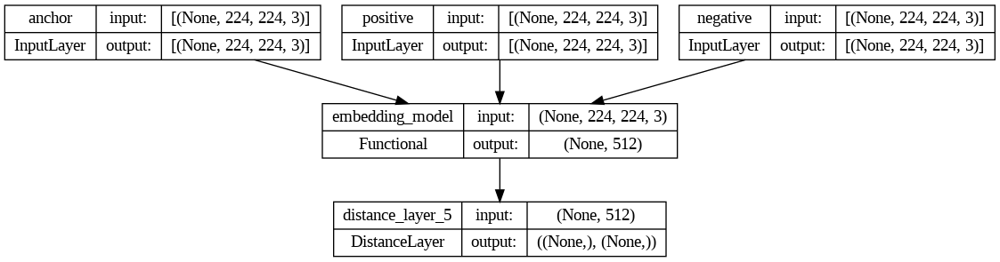

In [ ]:
# Visualize the architecture of the Siamese network. This generates a graphical representation of the model,
# showing all the layers, their shapes, and how they are connected. The `show_shapes=True` argument ensures
# that the shapes of the input and output tensors for each layer are displayed, which helps in understanding
# the data transformation through the network.
plot_model(siamese_network, show_shapes=True)

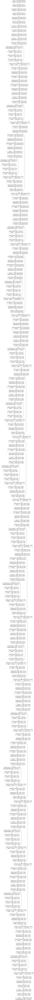

In [ ]:
# Similarly, visualize the embedding model used within the Siamese network. This is the model that processes
# each of the inputs (anchor, positive, negative) to generate embeddings. Visualizing this model separately
# can help focus on and understand the core feature extraction part of the Siamese network.
plot_model(embedding, show_shapes=True, to_file="resnet_embedding_model.jpeg")

##training the network

In [ ]:
def delete_files_in_directory(directory_path: str) -> NoReturn:
    """
    Deletes all files in the specified directory.

    This function attempts to clear all files within the given directory. It does not delete subdirectories or their contents.
    If an error occurs during the deletion process, it prints an error message.

    Args:
        directory_path (str): The path to the directory from which all files will be deleted.

    Returns:
        NoReturn: This function does not return anything. It either successfully deletes all files or prints an error message.
    """
    try:
        # List all entries in the directory
        files: List[str] = os.listdir(directory_path)
        for file in files:
            # Construct the full file path
            file_path: str = os.path.join(directory_path, file)
            # Check if it's a file and delete it if so
            if os.path.isfile(file_path):
                os.remove(file_path)
        print("All files deleted successfully.")
    except OSError as e:
        # An OSError is caught in case the directory does not exist or other OS-related errors occur
        print(f"Error occurred while deleting files: {e}")

In [ ]:
class StopTrainingOnPerfectAccuracy(tf.keras.callbacks.Callback):
    """
    A custom callback to halt training when the model achieves 100% accuracy with zero loss, indicating
    perfect learning on the training dataset. This efficient approach saves computational resources
    and time by avoiding unnecessary further training once optimal performance is attained.

    Designed to monitor accuracy and loss metrics at the end of each training epoch, this callback is
    particularly useful in large-scale training scenarios or with complex models where extended training
    sessions are common.
    """

    def on_epoch_end(self, epoch: int, logs: Optional[dict] = None) -> None:
        """
        Checks and stops training when the model reaches 100% accuracy and zero loss.

        This method is invoked at the end of each epoch and it terminates training early if the
        specified conditions of perfect accuracy and no loss are met, thereby ensuring training efficiency.

        Args:
            epoch (int): Current epoch index.
            logs (Optional[dict]): Performance metrics logged by the Keras engine.

        Returns:
            None: Directly modifies the model's `stop_training` attribute to halt training.
        """
        if logs is None:
            logs = {}

        accuracy = logs.get('accuracy', 0.0)  # Default to 0.0 if 'accuracy' not found
        loss = logs.get('loss', 1.0)  # Default to 1.0 if 'loss' not found

        if accuracy == 1.0 and loss == 0:
            print("\nReached 100% accuracy and zero loss, stopping training!")
            self.model.stop_training = True


In [ ]:
# Define the directory path where the weights of the ResNet model will be saved.
weights_dir = os.path.join(root_src, "resNetWeight")

# Delete all existing files in the weights directory to start fresh, preventing any overwrite issues
# or confusion with older model weights. This step is useful especially when re-running training processes
# to ensure that only the most recent training results are stored.
delete_files_in_directory(weights_dir)

# Setup a ModelCheckpoint callback to save the model's weights only, at the end of each epoch if there's an improvement
# in validation loss. This is crucial for long training sessions as it allows for recovery if the training is interrupted,
# and helps in loading the best model directly for further usage or evaluation without retraining.
##checkpoint = ModelCheckpoint(
##    os.path.join(weights_dir, 'model_epoch_{epoch:02d}.h5'),  # Path and filename format where weights will be saved
##    monitor="val_loss",   # The metric to monitor, here it's validation loss
##    mode="min",           # The monitoring objective; here 'min' signifies that the checkpoint should save the model when the quantity monitored has decreased
##    verbose=0,            # Verbosity mode 0 means silent, 1 would show messages related to the model saving
##    save_weights_only=True  # Specifies that only the weights will be saved, not the full model
##)

# ReduceLROnPlateau reduces the learning rate when a metric has stopped improving.
# This callback monitors the validation loss and adjusts the learning rate dynamically.
learning_rate_reduction = ReduceLROnPlateau(
    monitor='val_loss',  # Metric to monitor
    patience=3,          # Number of epochs with no improvement after which learning rate will be reduced
    verbose=1,           # Enable verbose output
    factor=0.4,          # Factor by which the learning rate will be reduced. new_lr = lr * factor
    min_lr=7.5e-8        # Lower bound on the learning rate
)

# Custom callback to stop training when the model reaches 100% accuracy and zero loss.
stop_training_callback = StopTrainingOnPerfectAccuracy()

All files deleted successfully.


In [ ]:
# Configure the optimizer to use Adam with a specific learning rate and weight decay.
# Additionally, wrap the Adam optimizer with a LossScaleOptimizer for mixed precision training.
# This allows the use of float16 operations where beneficial, improving performance on supported hardware.
opt = tf.keras.mixed_precision.LossScaleOptimizer(tf.keras.optimizers.AdamW(learning_rate=5e-4, clipnorm = 5))

# Initialize the SiameseModel using the previously defined siamese_network. This model will be
# used to compute and optimize the triplet loss during training.
siamese_model: SiameseModel = SiameseModel(siamese_network)

# Compile the siamese model with the specified optimizer and accuracy metrics.
# Here, 'weighted_metrics' allows the calculation of metrics like accuracy to consider the sample weights,
# if provided during training.
siamese_model.compile(
    optimizer=opt,
    metrics=["accuracy"],
    weighted_metrics=["accuracy"]
)

# Start training the model. The model will train for a total of 50 epochs, and it will use the
# validation dataset to evaluate the performance after each epoch. The training process includes
# several callbacks to enhance performance and ensure optimal stopping conditions:
# - checkpoint: Saves the best model weights based on validation loss.
# - stop_training_callback: Stops training when the model achieves perfect accuracy and zero loss.
# - learning_rate_reduction: Reduces the learning rate when the validation loss plateaus, helping to fine-tune the model.
history: History = siamese_model.fit(
    train_dataset,
    epochs=50,
    validation_data = val_dataset,
    callbacks=[stop_training_callback, learning_rate_reduction]
)

<pre width=200>
Epoch 1/50
20/20 [======] - 35s 1s/step - loss: 797.6123 - accuracy: 0.5992 - val_loss: 24.9589 - val_accuracy: 0.6438 - lr: 5.0000e-04
Epoch 2/50
20/20 [======] - 19s 938ms/step - loss: 7.0285 - accuracy: 0.7125 - val_loss: 1.7861 - val_accuracy: 0.6469 - lr: 5.0000e-04
Epoch 3/50
20/20 [======] - 19s 935ms/step - loss: 1.3010 - accuracy: 0.7273 - val_loss: 0.8239 - val_accuracy: 0.6344 - lr: 5.0000e-04
Epoch 4/50
20/20 [======] - 19s 938ms/step - loss: 0.7455 - accuracy: 0.7602 - val_loss: 0.9103 - val_accuracy: 0.6500 - lr: 5.0000e-04
Epoch 5/50
20/20 [======] - 19s 940ms/step - loss: 0.5981 - accuracy: 0.7977 - val_loss: 0.9187 - val_accuracy: 0.6531 - lr: 5.0000e-04
Epoch 6/50
20/20 [======] - 19s 944ms/step - loss: 0.6029 - accuracy: 0.8102 - val_loss: 0.7561 - val_accuracy: 0.6500 - lr: 5.0000e-04
Epoch 7/50
20/20 [======] - 19s 947ms/step - loss: 0.5188 - accuracy: 0.8562 - val_loss: 0.7274 - val_accuracy: 0.6812 - lr: 5.0000e-04
Epoch 8/50
20/20 [======] - 19s 946ms/step - loss: 0.4016 - accuracy: 0.8836 - val_loss: 1.0263 - val_accuracy: 0.7219 - lr: 5.0000e-04
Epoch 9/50
20/20 [======] - 19s 950ms/step - loss: 0.5181 - accuracy: 0.8805 - val_loss: 0.8935 - val_accuracy: 0.6938 - lr: 5.0000e-04
Epoch 10/50
20/20 [======] - ETA: 0s - loss: 0.3301 - accuracy: 0.9297
Epoch 10: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
20/20 [======] - 19s 950ms/step - loss: 0.3301 - accuracy: 0.9297 - val_loss: 1.0937 - val_accuracy: 0.7125 - lr: 5.0000e-04
Epoch 11/50
20/20 [======] - 19s 950ms/step - loss: 0.3122 - accuracy: 0.9219 - val_loss: 0.9384 - val_accuracy: 0.7031 - lr: 2.0000e-04
Epoch 12/50
20/20 [======] - 19s 951ms/step - loss: 0.1662 - accuracy: 0.9555 - val_loss: 0.7226 - val_accuracy: 0.7594 - lr: 2.0000e-04
Epoch 13/50
20/20 [======] - 19s 951ms/step - loss: 0.1407 - accuracy: 0.9508 - val_loss: 0.8027 - val_accuracy: 0.7563 - lr: 2.0000e-04
Epoch 14/50
20/20 [======] - 19s 951ms/step - loss: 0.0777 - accuracy: 0.9773 - val_loss: 1.1047 - val_accuracy: 0.7656 - lr: 2.0000e-04
Epoch 15/50
20/20 [======] - ETA: 0s - loss: 0.1333 - accuracy: 0.9633
Epoch 15: ReduceLROnPlateau reducing learning rate to 8.000000379979611e-05.
20/20 [======] - 19s 949ms/step - loss: 0.1333 - accuracy: 0.9633 - val_loss: 0.9226 - val_accuracy: 0.7719 - lr: 2.0000e-04
Epoch 16/50
20/20 [======] - 19s 949ms/step - loss: 0.0615 - accuracy: 0.9742 - val_loss: 0.6027 - val_accuracy: 0.8094 - lr: 8.0000e-05
Epoch 17/50
20/20 [======] - 19s 950ms/step - loss: 0.0375 - accuracy: 0.9820 - val_loss: 0.5572 - val_accuracy: 0.7875 - lr: 8.0000e-05
Epoch 18/50
20/20 [======] - 19s 950ms/step - loss: 0.0137 - accuracy: 0.9937 - val_loss: 0.5313 - val_accuracy: 0.8250 - lr: 8.0000e-05
Epoch 19/50
20/20 [======] - 19s 948ms/step - loss: 0.0057 - accuracy: 0.9984 - val_loss: 0.5766 - val_accuracy: 0.7844 - lr: 8.0000e-05
Epoch 20/50
20/20 [======] - 19s 949ms/step - loss: 0.0053 - accuracy: 0.9977 - val_loss: 0.6250 - val_accuracy: 0.7969 - lr: 8.0000e-05
Epoch 21/50
20/20 [======] - ETA: 0s - loss: 0.0096 - accuracy: 0.9984
Epoch 21: ReduceLROnPlateau reducing learning rate to 3.200000210199505e-05.
20/20 [======] - 19s 948ms/step - loss: 0.0096 - accuracy: 0.9984 - val_loss: 0.6246 - val_accuracy: 0.7875 - lr: 8.0000e-05
Epoch 22/50
20/20 [======] - 19s 946ms/step - loss: 0.0019 - accuracy: 0.9992 - val_loss: 0.5998 - val_accuracy: 0.7812 - lr: 3.2000e-05
Epoch 23/50
20/20 [======] - 19s 946ms/step - loss: 5.5847e-04 - accuracy: 1.0000 - val_loss: 0.5791 - val_accuracy: 0.7781 - lr: 3.2000e-05
Epoch 24/50
20/20 [======] - ETA: 0s - loss: 2.4414e-04 - accuracy: 0.9984
Epoch 24: ReduceLROnPlateau reducing learning rate to 1.280000142287463e-05.
20/20 [======] - 19s 948ms/step - loss: 2.4414e-04 - accuracy: 0.9984 - val_loss: 0.5746 - val_accuracy: 0.7812 - lr: 3.2000e-05
Epoch 25/50
20/20 [======] - 19s 950ms/step - loss: 2.1362e-04 - accuracy: 1.0000 - val_loss: 0.5664 - val_accuracy: 0.7875 - lr: 1.2800e-05
Epoch 26/50
20/20 [======] - ETA: 0s - loss: 0.0000e+00 - accuracy: 1.0000
Reached 100% accuracy and loss reached 0, so stopping training!!
20/20 [======] - 19s 946ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.5859 - val_accuracy: 0.7959 - lr: 1.2800e-05
</pre>

In [ ]:
# Define the path where the training history of the model will be saved.
# This uses the root source directory and appends a filename for the pickle file.
history_save_path: str = os.path.join(root_src, "resNetHistory.pkl")

# Open a file in write-binary ('wb') mode. If the file doesn't exist, it will be created.
# If it does exist, it will be overwritten, which is typically the desired behavior in training scenarios
# to ensure only the latest training data is saved.
with open(history_save_path, 'wb') as f:
    # Use pickle to serialize the history dictionary of the siamese model training session.
    # The history object contains metrics and loss values recorded at the end of each epoch during training.
    pickle.dump(history.history, f)

# The history of the model is now saved to 'resNetHistory.pkl' in the specified directory.
# This file can later be loaded to analyze or visualize the training progress of the model.

In [ ]:
# Attempt to perform inference with the Siamese model using the first batch from the test dataset.
# This operation is typically used for debugging purposes to ensure that the model can process data correctly.
# Here, the underscore (_) is used to ignore the output since this line is meant for testing execution.
_ = siamese_model(*test_ds.take(1))

# Define the epoch number from which to load the saved model weights. This allows for flexibility
# in choosing the model state that possibly performed best or is required for a specific evaluation.
saving_epoch: int = 18

# Construct the path to the specific weights file saved during the defined epoch. The weights are stored
# in the 'weights_dir' directory with a filename that reflects the epoch number.
weights_path: str = os.path.join(weights_dir, f"model_epoch_{saving_epoch:02d}.h5")

# Load the weights from the specified file into the Siamese model. This step is crucial for performing
# evaluations or continuing training from a specific state. It ensures that the model is accurately
# restored to the state it was in at the specified epoch.
siamese_model.load_weights(weights_path)
delete_files_in_directory(weights_dir)

All files deleted successfully.


##evaluating the model

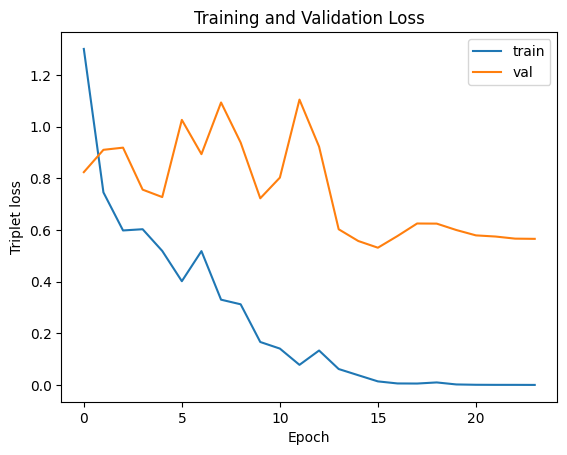

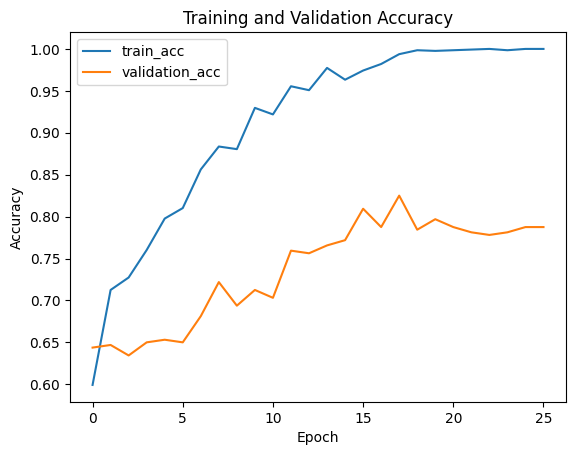

In [ ]:
# Visualize the learning progress of the model using the saved history.
learning_curves(history)

In [ ]:
# Call the function to print the best validation accuracy and the corresponding epoch from the training history.
print_best_val_accuracy_and_epoch(history)

<h4>The maximum validation accuracy was 82.50% and it was reached on epoch 18 out of 26
</h4>

In [ ]:
# Evaluate the dataset difficulty by computing average cosine similarities using the embedding model
# and the test dataset. It shows how distinct the embeddings are for positive and negative samples.
print(evaluate_dataset_difficulty_with_embeddings(embedding, test_ds, len(test_gen)))

<h4>{'average_anchor_positive_similarity': 0.8837372, 'average_anchor_negative_similarity': 0.8049553}

</h4>

In [ ]:
# Calculate and print the average distances between anchor-positive and anchor-negative pairs using the Siamese model.
# This metric helps in assessing the separation enforced by the model in the embedding space.
print(avg_distance(siamese_model, test_ds))

{'average_anchor_positive_distance': array([7.242], dtype=float16), 'average_anchor_negative_distance': array([12.92], dtype=float16)}


<h4>{'average_anchor_positive_distance': 7.242, 'average_anchor_negative_distance': 12.92}


</h4>

In [ ]:
# Evaluate the Siamese model on the entire test dataset. This function prints the loss and accuracy
# of the model on the test data, giving a clear indication of how well the model generalizes to new data.
evaluating_the_model(siamese_model, test_ds)

<h5>320/320 [======] - 12s 37ms/step - loss: 0.6416 - accuracy: 0.7875 </br>
Test loss: 0.641644299030304 </br>
Test accuracy: 78.75%
</h5>

#transfer learning

In [ ]:
base_model: Model = tf.keras.applications.MobileNetV2(include_top=False, pooling='avg', input_shape=(224, 224, 3))
# Freeze model
base_model.trainable = False

In [ ]:
inputs: Tensor = Input(shape=(224, 224, 3))
# Training=false to keep layers like batchnorm in inference mode
base_model_output: Model = base_model(inputs, training=False)
# Add a classification head suited to our  problem
outputs: Tensor = Dense(1024, activation='linear', kernel_initializer='he_normal', kernel_regularizer='l2')(base_model_output)
tl_model: Model = Model(inputs, outputs)

In [ ]:
target_shape: Tuple[int] = (224,224,3)

# Setup Network
anchor_input: Tensor = Input(name="anchor", shape=target_shape)
positive_input: Tensor = Input(name="positive", shape=target_shape)
negative_input: Tensor = Input(name="negative", shape=target_shape)

# Calculate the distances
distances: Tensor = DistanceLayer()(
    tl_model(anchor_input),
    tl_model(positive_input),
    tl_model(negative_input)
)

siamese_transfer_network: Model = Model(
    inputs=[anchor_input, positive_input, negative_input], outputs=distances
)


In [ ]:
siamese_transfer_network.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 anchor (InputLayer)         [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 positive (InputLayer)       [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 negative (InputLayer)       [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 model (Functional)          (None, 1024)                 3569728   ['anchor[0][0]',              
                                                                     'positive[0][0]',      

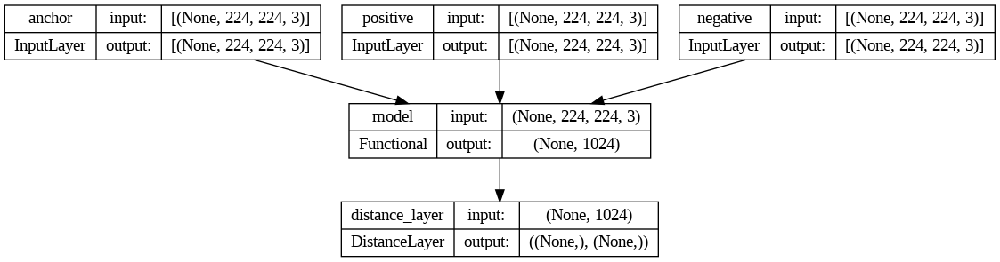

In [ ]:
plot_model(siamese_transfer_network, show_shapes=True)

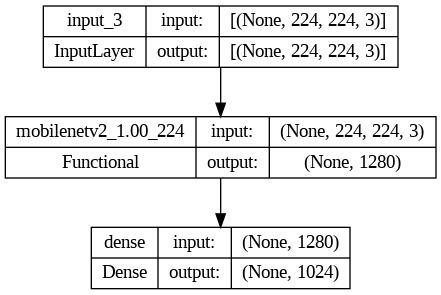

In [ ]:
plot_model(tl_model, show_shapes=True)

In [ ]:
class StopTrainingOnPerfectAccuracy(tf.keras.callbacks.Callback):
    """
    A custom callback to halt training when the model achieves 100% accuracy with zero loss, indicating
    perfect learning on the training dataset. This efficient approach saves computational resources
    and time by avoiding unnecessary further training once optimal performance is attained.

    Designed to monitor accuracy and loss metrics at the end of each training epoch, this callback is
    particularly useful in large-scale training scenarios or with complex models where extended training
    sessions are common.
    """

    def on_epoch_end(self, epoch: int, logs: Optional[dict] = None) -> None:
        """
        Checks and stops training when the model reaches 100% accuracy and zero loss.

        This method is invoked at the end of each epoch and it terminates training early if the
        specified conditions of perfect accuracy and no loss are met, thereby ensuring training efficiency.

        Args:
            epoch (int): Current epoch index.
            logs (Optional[dict]): Performance metrics logged by the Keras engine.

        Returns:
            None: Directly modifies the model's `stop_training` attribute to halt training.
        """
        if logs is None:
            logs = {}

        accuracy = logs.get('accuracy', 0.0)  # Default to 0.0 if 'accuracy' not found
        loss = logs.get('loss', 1.0)  # Default to 1.0 if 'loss' not found

        if accuracy == 1.0 and loss == 0:
            print("\nReached 100% accuracy and zero loss, stopping training!")
            self.model.stop_training = True

In [ ]:
weights_dir: str = os.path.join(root_src,"transferLrWeight")
checkpoint = ModelCheckpoint(os.path.join(weights_dir, 'model_epoch_{epoch:02d}.h5'),
                             monitor="val_loss",
                             mode="min",
                             verbose=0,
                             save_weights_only=True)

earlystop = EarlyStopping(monitor = 'val_loss',
                          min_delta = 0,
                          patience = 10,
                          verbose = 1,
                          restore_best_weights = True)

learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss',
                                            patience=3,
                                            verbose=1,
                                            factor=0.3,
                                            min_lr=7.5e-8)
terminate_on_nan = TerminateOnNaN()

stop_training_callback = StopTrainingOnPerfectAccuracy()

In [ ]:
opt = tf.keras.mixed_precision.LossScaleOptimizer(tf.keras.optimizers.Adam(learning_rate=1e-3))

transfer_model: SiameseModel = SiameseModel(siamese_transfer_network)
transfer_model.compile(optimizer=opt, metrics=["accuracy"], weighted_metrics=["accuracy"])
history: History = transfer_model.fit(train_ds, epochs=20, validation_data=val_ds, callbacks=[checkpoint, stop_training_callback, learning_rate_reduction])

Epoch 1/20
20/20 [==============================] - 54s 2s/step - loss: 17.9454 - accuracy: 0.8266 - val_loss: 11.7977 - val_accuracy: 0.8094 - lr: 0.0010
Epoch 2/20
20/20 [==============================] - 5s 247ms/step - loss: 4.2999 - accuracy: 0.9516 - val_loss: 10.3641 - val_accuracy: 0.8219 - lr: 0.0010
Epoch 3/20
20/20 [==============================] - 5s 247ms/step - loss: 0.3294 - accuracy: 0.9961 - val_loss: 10.9023 - val_accuracy: 0.8125 - lr: 0.0010
Epoch 4/20
20/20 [==============================] - 5s 247ms/step - loss: 0.1047 - accuracy: 0.9984 - val_loss: 11.8746 - val_accuracy: 0.8500 - lr: 0.0010
Epoch 5/20
20/20 [==============================] - ETA: 0s - loss: 0.1182 - accuracy: 1.0000
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
20/20 [==============================] - 5s 247ms/step - loss: 0.1182 - accuracy: 1.0000 - val_loss: 11.3910 - val_accuracy: 0.8562 - lr: 0.0010
Epoch 6/20
20/20 [==============================] - 5s 247ms/s

<pre width=200>
Epoch 1/20
20/20 [======] - 54s 2s/step - loss: 17.9454 - accuracy: 0.8266 - val_loss: 11.7977 - val_accuracy: 0.8094 - lr: 0.0010
Epoch 2/20
20/20 [======] - 5s 247ms/step - loss: 4.2999 - accuracy: 0.9516 - val_loss: 10.3641 - val_accuracy: 0.8219 - lr: 0.0010
Epoch 3/20
20/20 [======] - 5s 247ms/step - loss: 0.3294 - accuracy: 0.9961 - val_loss: 10.9023 - val_accuracy: 0.8125 - lr: 0.0010
Epoch 4/20
20/20 [======] - 5s 247ms/step - loss: 0.1047 - accuracy: 0.9984 - val_loss: 11.8746 - val_accuracy: 0.8500 - lr: 0.0010
Epoch 5/20
20/20 [======] - ETA: 0s - loss: 0.1182 - accuracy: 1.0000
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
20/20 [======] - 5s 247ms/step - loss: 0.1182 - accuracy: 1.0000 - val_loss: 11.3910 - val_accuracy: 0.8562 - lr: 0.0010
Epoch 6/20
20/20 [======] - 5s 247ms/step - loss: 0.0294 - accuracy: 1.0000 - val_loss: 11.5387 - val_accuracy: 0.8625 - lr: 3.0000e-04
Epoch 7/20
20/20 [======] - ETA: 0s - loss: 0.0000e+00 - accuracy: 1.0000
 Reached 100% accuracy and loss reached 0, so stopping training!!
20/20 [======] - 5s 248ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 11.5199 - val_accuracy: 0.8625 - lr: 3.0000e-04

</pre>

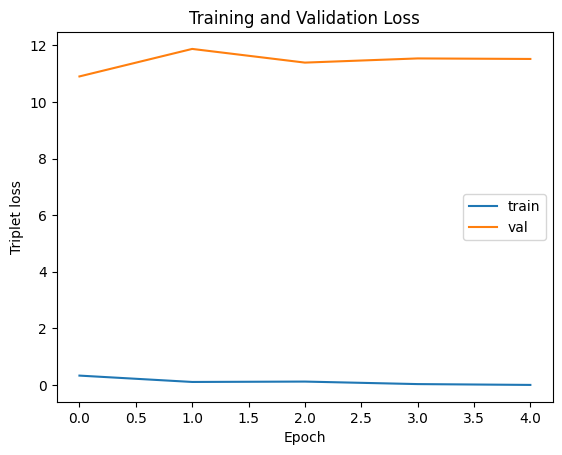

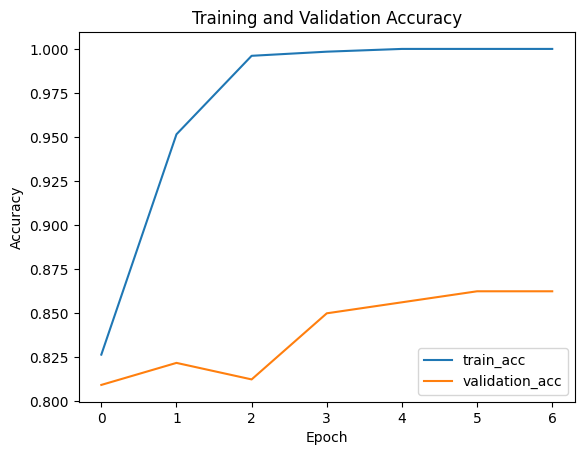

In [ ]:
learning_curves(history)

In [ ]:
print_best_val_accuracy_and_epoch(history)

<h5>The maximum validation accuracy was 86.25% and it was reached on epoch 6 out of 7
</h5>

# evaluating the model

<h4 dir="rtl">לאחר הסתכלות זריזה בנתוני האימון הגעתי למסקנה שלא לטעון את המשקלים של אחד האיפוקים הקודמים</h4>

In [ ]:
print(evaluate_dataset_difficulty_with_embeddings(tl_model, test_ds, len(test_gen)))

<h5>{'average_anchor_positive_similarity': 0.7074317932128906, 'average_anchor_negative_similarity': 0.5828800201416016}
</h5>

In [ ]:
print(avg_distance(transfer_model, test_ds))

<h5>{'average_anchor_positive_distance': 313.0, 'average_anchor_negative_distance': 438.0}
</h5>

In [ ]:
evaluating_the_model(transfer_model, test_ds)

<h5>
320/320 [======] - 6s 19ms/step - loss: 13.6555 - accuracy: 0.8281</br>
Test loss: 13.655468940734863</br>
Test accuracy: 82.81% => 82.8125
</h5>